# Exploratory Data Analysis

 We will perform all future analysis and querying of the data in .ipynb files. .ipynb files are a great medium to tell the story of the EDA process and later analysis of the data. We will creating the classes in .py files and import them into this .ipynb for use.

In [1]:
import sys
sys.path.insert(0, ".")

from pathlib import Path
import db_utils
import pandas as pd

db_utils

df = pd.read_csv('loan_payments.csv')
df.head()

,id,member_id,loan_amount,funded_amount,funded_amount_inv,term,int_rate,instalment,grade,sub_grade,...,recoveries,collection_recovery_fee,last_payment_date,last_payment_amount,next_payment_date,last_credit_pull_date,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type
0,38676116,41461848,8000,8000.0,8000.0,36 months,7.49,248.82,A,A4,...,0.0,0.0,Jan-2022,248.82,Feb-2022,Jan-2022,0.0,5.0,1,INDIVIDUAL
1,38656203,41440010,13200,13200.0,13200.0,36 months,6.99,407.52,A,A3,...,0.0,0.0,Jan-2022,407.52,Feb-2022,Jan-2022,0.0,NaN,1,INDIVIDUAL
2,38656154,41439961,16000,16000.0,16000.0,36 months,7.49,497.63,A,A4,...,0.0,0.0,Oct-2021,12850.16,NaN,Oct-2021,0.0,NaN,1,INDIVIDUAL
3,38656128,41439934,15000,15000.0,15000.0,36 months,14.31,514.93,C,C4,...,0.0,0.0,Jun-2021,13899.67,NaN,Jun-2021,0.0,NaN,1,INDIVIDUAL
4,38656121,41439927,15000,15000.0,15000.0,36 months,6.03,456.54,A,A1,...,0.0,0.0,Jan-2022,456.54,Feb-2022,Jan-2022,0.0,NaN,1,INDIVIDUAL


In [2]:
print('The first row of the data is:')
df.iloc[0]

The first row of the data is:


id                                 38676116
member_id                          41461848
loan_amount                            8000
funded_amount                        8000.0
funded_amount_inv                    8000.0
term                              36 months
int_rate                               7.49
instalment                           248.82
grade                                     A
sub_grade                                A4
employment_length                   5 years
home_ownership                     MORTGAGE
annual_inc                          46000.0
verification_status            Not Verified
issue_date                         Jan-2021
loan_status                         Current
payment_plan                              n
purpose                         credit_card
dti                                   19.54
delinq_2yrs                               2
earliest_credit_line               Oct-1987
inq_last_6mths                            1
mths_since_last_delinq          

# Converting columns to the correct format

After familiarising ourselves with the data, we should alter any columns that aren't in the correct format. 

Because there are columns which should be converted into a different format, we create a DataTransform class to handle these conversions. 

We have added methods to the DataTransform class which we can apply to the DataFrame columns to perform any required conversions. 

We can list the unique elements in each column of the data for easier inspection, alongside the column's current datatype:

In [3]:
for column_name in df.columns:
    print(column_name, 'has these unique elements: ')
    print(set(df[column_name]))
    print (column_name, 'has current df type of', df[column_name].dtype, '\n')

id has these unique elements: 
{38141958, 9175049, 3932170, 38141963, 6815755, 393228, 7077904, 38535185, 6815762, 655377, 7077908, 6815770, 524316, 9175070, 655392, 8126497, 7077925, 38141991, 7077933, 1048621, 6291506, 5505075, 7340088, 7077945, 38535227, 8126532, 7077956, 1048647, 38535241, 38535242, 9175114, 6815821, 38535247, 8126543, 9175121, 6815827, 7077972, 38142037, 1048666, 8126558, 393310, 786529, 6815842, 393313, 6815847, 786538, 786542, 6815857, 1048690, 6815864, 786552, 524408, 9175163, 8126587, 7078014, 7078015, 38142081, 786563, 6815879, 8126600, 786569, 786567, 38535309, 7078031, 393361, 8126610, 7078037, 131223, 9175192, 38142105, 38142106, 524446, 524447, 9175207, 393387, 524462, 38535347, 786611, 38142133, 8126646, 524472, 393403, 524478, 38535359, 38535360, 524479, 786626, 786627, 38142148, 38535365, 786633, 8126666, 38535371, 38142155, 7078093, 6291662, 8126677, 9175258, 7340250, 7078109, 1048797, 9175263, 1048800, 786655, 6815970, 393440, 7078116, 1048806, 38535

In [4]:
print(df.dtypes)

id                               int64
member_id                        int64
loan_amount                      int64
funded_amount                  float64
funded_amount_inv              float64
term                            object
int_rate                       float64
instalment                     float64
grade                           object
sub_grade                       object
employment_length               object
home_ownership                  object
annual_inc                     float64
verification_status             object
issue_date                      object
loan_status                     object
payment_plan                    object
purpose                         object
dti                            float64
delinq_2yrs                      int64
earliest_credit_line            object
inq_last_6mths                   int64
mths_since_last_delinq         float64
mths_since_last_record         float64
open_accounts                    int64
total_accounts           

##  Are there columns that could be represented better numerically?

Some columns are in float64 format, but because all of their elements are integers, we can and should convert their datatype to int64 to save space:
annual_inc
mths_since_last_record
collections_12_mths_ex_med
mths_since_last_major_derog

In [5]:
for column_name in ('annual_inc','mths_since_last_record','collections_12_mths_ex_med','mths_since_last_major_derog'):
    print(column_name, ': ',df[column_name].dtype)

annual_inc :  float64
mths_since_last_record :  float64
collections_12_mths_ex_med :  float64
mths_since_last_major_derog :  float64


In [6]:
from DataTransform import DataTransform
df_transforming_instance = DataTransform()

for column_name in ('annual_inc','mths_since_last_record','collections_12_mths_ex_med','mths_since_last_major_derog'):
            df = df_transforming_instance.convert_to_int(df, column_name)

In [7]:
for column_name in ('annual_inc','mths_since_last_record','collections_12_mths_ex_med','mths_since_last_major_derog'):
    print(column_name, ': ',df[column_name].dtype)

annual_inc :  int64
mths_since_last_record :  float64
collections_12_mths_ex_med :  float64
mths_since_last_major_derog :  float64


Only annual_inc can currently be ocnverted into int64. Because some of the columns have NaN values, they cannto yet be covnerted into int64.

In [8]:
# count how many NaN valeus there are:
for column_name in ('annual_inc','mths_since_last_record','collections_12_mths_ex_med','mths_since_last_major_derog'):
    print(column_name, 'has ',df[column_name].isna().sum(), 'NaN values.')

annual_inc has  0 NaN values.
mths_since_last_record has  48050 NaN values.
collections_12_mths_ex_med has  51 NaN values.
mths_since_last_major_derog has  46732 NaN values.


## Are dates in the correct format?


In [9]:
date_mask = df.columns.str.contains('date')

print(df.loc[:,date_mask])

print(df.loc[:,date_mask].dtypes) # selects mask and prints dtypes

      issue_date last_payment_date next_payment_date last_credit_pull_date
0       Jan-2021          Jan-2022          Feb-2022              Jan-2022
1       Jan-2021          Jan-2022          Feb-2022              Jan-2022
2       Jan-2021          Oct-2021               NaN              Oct-2021
3       Jan-2021          Jun-2021               NaN              Jun-2021
4       Jan-2021          Jan-2022          Feb-2022              Jan-2022
...          ...               ...               ...                   ...
54226   Jul-2013          Jul-2016               NaN              Jul-2016
54227   Oct-2013          Oct-2016               NaN              Sep-2016
54228   Aug-2013          Sep-2016          Sep-2016              May-2013
54229   Aug-2013          Mar-2014               NaN              May-2013
54230   Jul-2013          Mar-2014          Dec-2014              Jan-2015

[54231 rows x 4 columns]
issue_date               object
last_payment_date        object
next_payme

No! So we should convert these objects (strings) into dates. 

In [10]:

for column_name in ('issue_date', 'last_payment_date', 'next_payment_date', 'last_credit_pull_date'):
            df = df_transforming_instance.date_convert(df, column_name)

And now we can see these columns are in date format:

In [11]:
print(df.loc[:,date_mask])

print(df.loc[:,date_mask].dtypes) # selects mask and prints dtypes

      issue_date last_payment_date next_payment_date last_credit_pull_date
0     2021-01-01        2022-01-01        2022-02-01            2022-01-01
1     2021-01-01        2022-01-01        2022-02-01            2022-01-01
2     2021-01-01        2021-10-01               NaT            2021-10-01
3     2021-01-01        2021-06-01               NaT            2021-06-01
4     2021-01-01        2022-01-01        2022-02-01            2022-01-01
...          ...               ...               ...                   ...
54226 2013-07-01        2016-07-01               NaT            2016-07-01
54227 2013-10-01        2016-10-01               NaT            2016-09-01
54228 2013-08-01        2016-09-01        2016-09-01            2013-05-01
54229 2013-08-01        2014-03-01               NaT            2013-05-01
54230 2013-07-01        2014-03-01        2014-12-01            2015-01-01

[54231 rows x 4 columns]
issue_date               datetime64[ns]
last_payment_date        datetime6

## Should some columns be categorical? 


Yes, some columns in the data should be categorical, when they have a small quantity of possible options:

In [12]:
for column_name in ('term','grade','sub_grade','employment_length','home_ownership','verification_status','loan_status','purpose'):
    print('The',column_name,'column only has', len(set(df[column_name])),'unique options:')
    print(set(df[column_name]))
    print(column_name,'has datatype:',df[column_name].dtype,'\n')

The term column only has 3 unique options:
{nan, '60 months', '36 months'}
term has datatype: object 

The grade column only has 7 unique options:
{'C', 'D', 'F', 'A', 'B', 'E', 'G'}
grade has datatype: object 

The sub_grade column only has 35 unique options:
{'D3', 'F1', 'E1', 'A1', 'C3', 'E4', 'B1', 'D5', 'F5', 'E3', 'B2', 'A3', 'C2', 'G4', 'D2', 'F4', 'B5', 'F3', 'A4', 'F2', 'G3', 'C4', 'C5', 'G1', 'A2', 'E5', 'G2', 'B4', 'A5', 'E2', 'C1', 'B3', 'D4', 'G5', 'D1'}
sub_grade has datatype: object 

The employment_length column only has 12 unique options:
{'3 years', '9 years', '7 years', '1 year', '5 years', '4 years', '8 years', '< 1 year', nan, '2 years', '10+ years', '6 years'}
employment_length has datatype: object 

The home_ownership column only has 5 unique options:
{'MORTGAGE', 'RENT', 'OWN', 'NONE', 'OTHER'}
home_ownership has datatype: object 

The verification_status column only has 3 unique options:
{'Verified', 'Not Verified', 'Source Verified'}
verification_status has da

We can convert them into the category datatype:

In [13]:
for column_name in ('term','grade','sub_grade','employment_length','home_ownership','verification_status','loan_status','purpose'):
            df = df_transforming_instance.convert_to_category(df, column_name)

In [14]:
for column_name in ('term','grade','sub_grade','employment_length','home_ownership','verification_status','loan_status','purpose'):
    # print('The',column_name,'column only has', len(set(df[column_name])),'unique options:')
    # print(set(df[column_name]))
    print(column_name,'has datatype:',df[column_name].dtype,'\n')

term has datatype: category 

grade has datatype: category 

sub_grade has datatype: category 

employment_length has datatype: category 

home_ownership has datatype: category 

verification_status has datatype: category 

loan_status has datatype: category 

purpose has datatype: category 



## Are there any excess symbols in the data?

The payment_plan column only contain two options:

In [15]:
column_name = 'payment_plan'
print('The',column_name,'column only has', len(set(df[column_name])),'unique options:')
print(set(df[column_name]))
print(column_name,'has datatype:',df[column_name].dtype,'\n')

The payment_plan column only has 2 unique options:
{'y', 'n'}
payment_plan has datatype: object 



This column can be turned into a boolean column to remove excess symbols from the data:

In [16]:
column_name = 'payment_plan'
df = df_transforming_instance.convert_to_boolean(df, column_name)

In [17]:
column_name = 'payment_plan'
print('The',column_name,'column only has', len(set(df[column_name])),'unique options:')
print(set(df[column_name]))
print(column_name,'has datatype:',df[column_name].dtype,'\n')

The payment_plan column only has 2 unique options:
{False, True}
payment_plan has datatype: boolean 



## Determining the amount of NULLs in each column



Let's visualise the null values in the data:

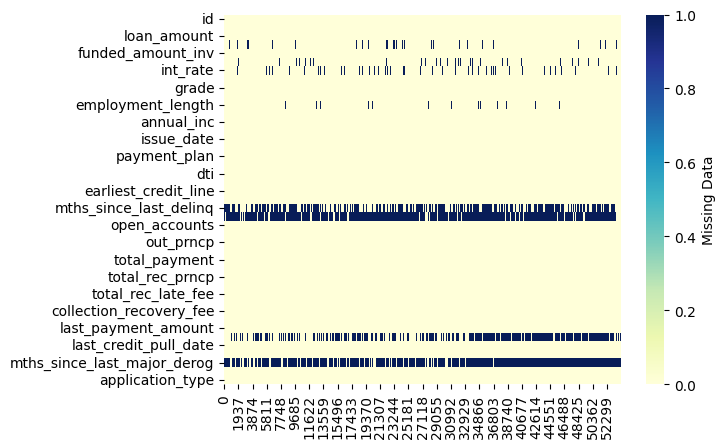

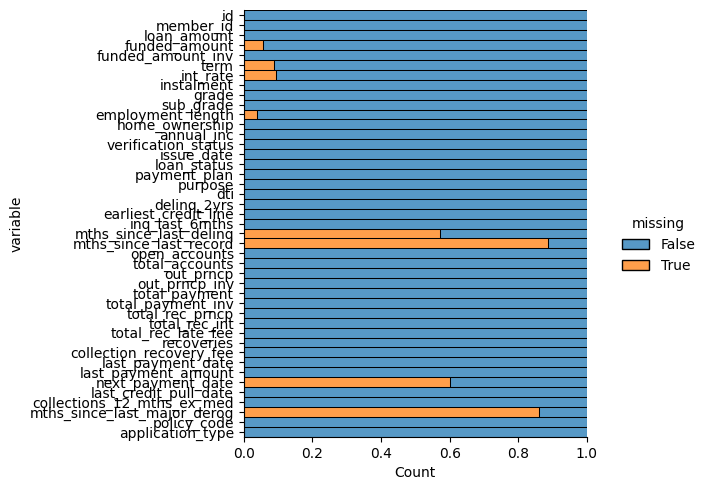

In [18]:
from Plotter import Plotter
plotter_instance = Plotter()
plotter_instance.visualise_null_values(df)


These columns should be dropped because they each contain mostly NULL values:

In [19]:
from DataFrameInfo import DataFrameInfo
DataFrameInfo_instance = DataFrameInfo()
print(DataFrameInfo_instance.find_extreme_amounts_of_null_values(df))

mths_since_last_delinq has 31002 null values out of 54231 values, which is 57.17 percent of the column.
This column should be removed, because most of it is null values.
mths_since_last_record has 48050 null values out of 54231 values, which is 88.6 percent of the column.
This column should be removed, because most of it is null values.
next_payment_date has 32608 null values out of 54231 values, which is 60.13 percent of the column.
This column should be removed, because most of it is null values.
mths_since_last_major_derog has 46732 null values out of 54231 values, which is 86.17 percent of the column.
This column should be removed, because most of it is null values.
The rest of the columns have less than 50% null values.
None


So we drop those columns:

In [20]:
print('The length of each row is:')
len(df.iloc[0])

The length of each row is:


43

In [21]:
for column_name in ('mths_since_last_delinq','mths_since_last_record','next_payment_date','mths_since_last_major_derog'):
    df = df.drop(column_name,axis=1)



And check that the columns have been dropped:

In [22]:
# print('The first row of the data is:')
# df.iloc[0]
print('The length of each row is:')
len(df.iloc[0])

The length of each row is:


39

In [23]:
print(df.dtypes)

id                                     int64
member_id                              int64
loan_amount                            int64
funded_amount                        float64
funded_amount_inv                    float64
term                                category
int_rate                             float64
instalment                           float64
grade                               category
sub_grade                           category
employment_length                   category
home_ownership                      category
annual_inc                             int64
verification_status                 category
issue_date                    datetime64[ns]
loan_status                         category
payment_plan                         boolean
purpose                             category
dti                                  float64
delinq_2yrs                            int64
earliest_credit_line                  object
inq_last_6mths                         int64
open_accou

## Imputing NULL values

We have columns that cotnain null values, but are not motly null values, we should aim to fill in the gaps by imputign the null values with estiamtes ('imputing')

In [24]:
print(DataFrameInfo_instance.calculate_percentages_of_null_values(df))

id has 0 null values out of 54231 values, which is 0.0 percent of the column.
member_id has 0 null values out of 54231 values, which is 0.0 percent of the column.
loan_amount has 0 null values out of 54231 values, which is 0.0 percent of the column.
funded_amount has 3007 null values out of 54231 values, which is 5.54 percent of the column.
funded_amount_inv has 0 null values out of 54231 values, which is 0.0 percent of the column.
term has 4772 null values out of 54231 values, which is 8.8 percent of the column.
int_rate has 5169 null values out of 54231 values, which is 9.53 percent of the column.
instalment has 0 null values out of 54231 values, which is 0.0 percent of the column.
grade has 0 null values out of 54231 values, which is 0.0 percent of the column.
sub_grade has 0 null values out of 54231 values, which is 0.0 percent of the column.
employment_length has 2118 null values out of 54231 values, which is 3.91 percent of the column.
home_ownership has 0 null values out of 5423

term and employment_length are categroical columns with null values.
the otehr categroical columns do not have null values.
We could drop these columns, but because they have less than 10% null values, we can reasonably impute both column's null values with the mode of their respective categories: 

In [25]:
from DataFrameTransform import DataFrameTransform
dataframe_transforming_instance = DataFrameTransform()

df = dataframe_transforming_instance.impute(df,'term','mode')
df = dataframe_transforming_instance.impute(df,'employment_length','mode')

Within the DataFrameTransform class we create a method which can impute the DataFrame's columns. 
 
For the non-categorical columns, we decide whether the column should be imputed with the median or the mean:

In [26]:
# from matplotlib import matplotlib
import matplotlib.pyplot as plt
import matplotlib.style as style
import seaborn as sns

# plt.rc("axes.spines", top=False, right=False)
# sns.set_style(style='darkgrid', rc=None)

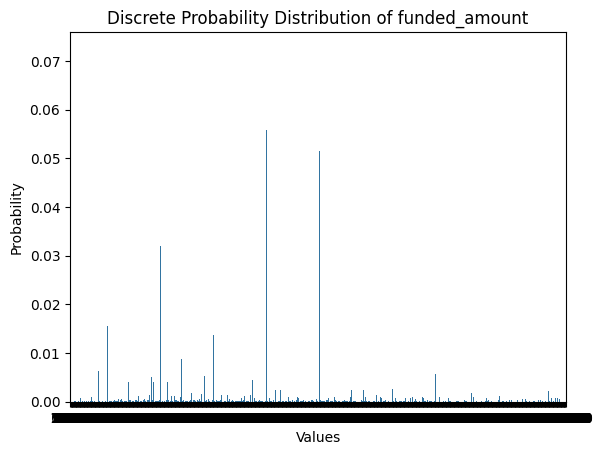

The mode of the distribution is 10000.0
The mean of the distribution is 13229.50911682024
The median of the distribution is 12000.0


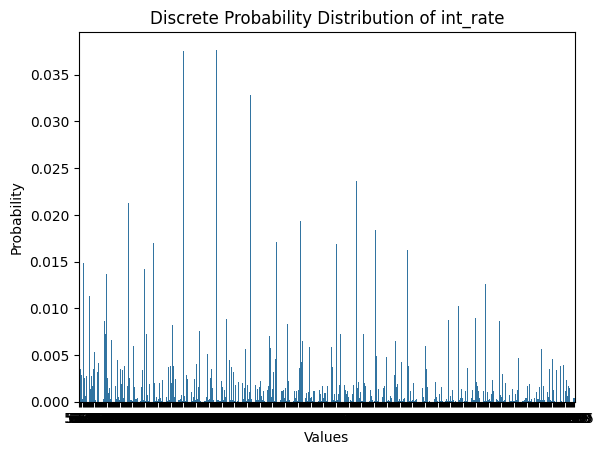

The mode of the distribution is 11.99
The mean of the distribution is 13.507328482328484
The median of the distribution is 13.16


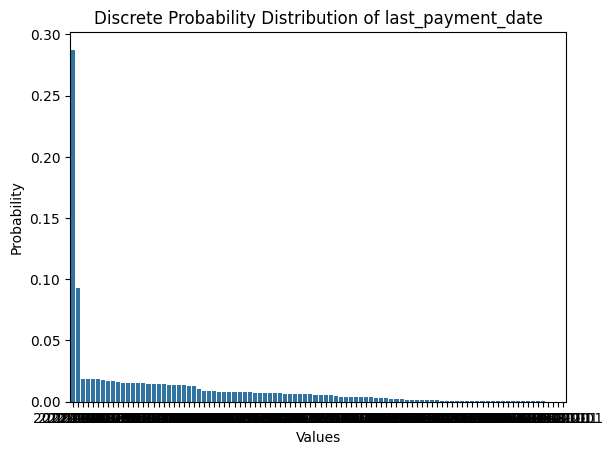

The mode of the distribution is 2022-01-01 00:00:00
The mean of the distribution is 2020-08-23 00:21:38.600391680
The median of the distribution is 2021-04-01 00:00:00


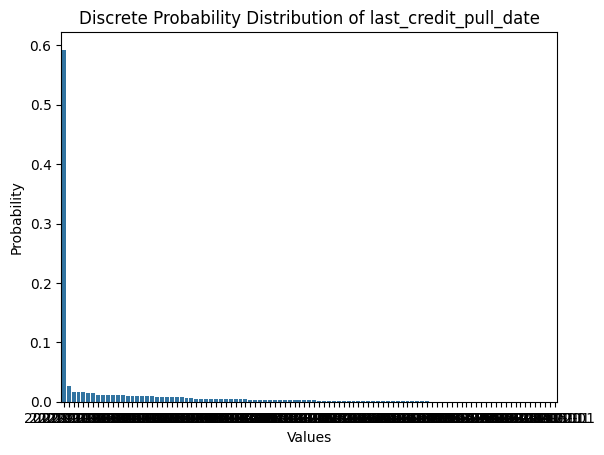

The mode of the distribution is 2022-01-01 00:00:00
The mean of the distribution is 2021-04-15 16:16:28.964296192
The median of the distribution is 2022-01-01 00:00:00


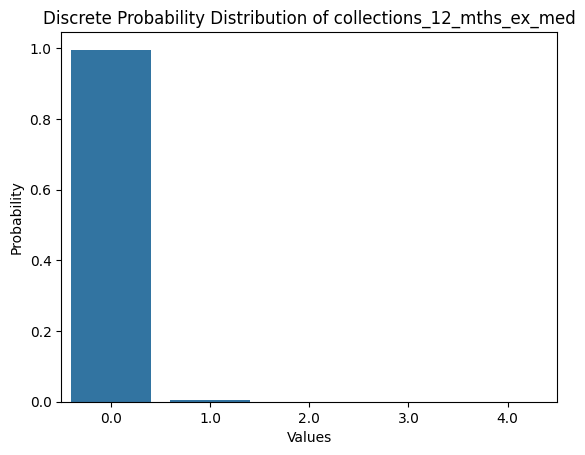

The mode of the distribution is 0.0
The mean of the distribution is 0.004208194905869324
The median of the distribution is 0.0


In [27]:



for column_name in df:
    if df[column_name].dtype != 'category':
        null_count = df[column_name].isna().sum()
        if null_count>0:
            # Calculate value counts and convert to probabilities
            probs = df[column_name].value_counts(normalize=True)

            # Create bar plot
            dpd=sns.barplot(y=probs.values, x=probs.index) 

            plt.xlabel('Values')
            plt.ylabel('Probability')
            plt.title('Discrete Probability Distribution of '+column_name)
            plt.show()
            print(f"The mode of the distribution is {df[column_name].mode()[0]}")
            print(f"The mean of the distribution is {df[column_name].mean()}")
            print(f"The median of the distribution is {df[column_name].median()}")

funded_amount should have the median used to impute NULL values because the mode is not  overhwlemignly most-freuent, and the mean is clsoe to the median, yet affected by higehr values.

int_rate should have the median used to impute NULL values because the mode is not an overhwlemignly most-freuent, and the mean is clsoe to the median, yet affected by higehr values.

last_payment_Date and last_credit_pull_date and collections_12_mths_ex_med should have the mode used to impute NULL values because the mode is  overhwlemignly most-fireuqent by a large margin.

In [28]:
df = dataframe_transforming_instance.impute(df,'funded_amount','median')
df = dataframe_transforming_instance.impute(df,'int_rate','median')
df = dataframe_transforming_instance.impute(df,'last_payment_date','mode')
df = dataframe_transforming_instance.impute(df,'last_credit_pull_date','mode')
df = dataframe_transforming_instance.impute(df,'collections_12_mths_ex_med','mode')

then check what has changed:

In [29]:
print(DataFrameInfo_instance.calculate_percentages_of_null_values(df))

id has 0 null values out of 54231 values, which is 0.0 percent of the column.
member_id has 0 null values out of 54231 values, which is 0.0 percent of the column.
loan_amount has 0 null values out of 54231 values, which is 0.0 percent of the column.
funded_amount has 0 null values out of 54231 values, which is 0.0 percent of the column.
funded_amount_inv has 0 null values out of 54231 values, which is 0.0 percent of the column.
term has 0 null values out of 54231 values, which is 0.0 percent of the column.
int_rate has 0 null values out of 54231 values, which is 0.0 percent of the column.
instalment has 0 null values out of 54231 values, which is 0.0 percent of the column.
grade has 0 null values out of 54231 values, which is 0.0 percent of the column.
sub_grade has 0 null values out of 54231 values, which is 0.0 percent of the column.
employment_length has 0 null values out of 54231 values, which is 0.0 percent of the column.
home_ownership has 0 null values out of 54231 values, which

In [30]:
null_counts = DataFrameInfo_instance.count_amounts_of_null_values(df)
null_counts[null_counts > 0].sort_values(ascending=False)

last_payment_date             73
collections_12_mths_ex_med    51
last_credit_pull_date          7
dtype: int64

We still have some null values that were not successfully imputed. Let's investigate:

In [31]:
import numpy as np
np.where(pd.isnull(df))

(array([ 1963,  2367,  2489,  3486,  3530,  3638,  5840,  8097, 10752,
        13807, 14394, 15495, 15954, 16273, 16402, 17573, 17582, 18349,
        19546, 21600, 21982, 26560, 27342, 27503, 27683, 28187, 28223,
        28561, 29372, 32309, 32900, 33422, 34686, 35285, 35665, 37659,
        38326, 38758, 38988, 39024, 39110, 39274, 40090, 40223, 40557,
        40674, 40773, 41364, 41379, 42215, 42292, 42469, 44663, 45453,
        46179, 46233, 47069, 47335, 47566, 48933, 49016, 49529, 49535,
        49611, 49634, 49853, 49958, 50188, 50370, 50542, 50561, 51084,
        51202, 51651, 51659, 51798, 52663, 53540, 53593, 53926, 54146,
        54164, 54171, 54174, 54176, 54177, 54179, 54180, 54181, 54182,
        54183, 54184, 54185, 54186, 54187, 54189, 54191, 54192, 54193,
        54194, 54195, 54196, 54197, 54198, 54200, 54201, 54202, 54205,
        54206, 54207, 54208, 54209, 54210, 54211, 54212, 54213, 54214,
        54215, 54216, 54217, 54218, 54219, 54220, 54222, 54223, 54224,
      

In [32]:
df.iloc[1963,33]

NaT

In [33]:
[df.iloc[i,j] for i,j in zip(*np.where(pd.isnull(df)))]

[NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 NaT,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan]

Most remianign columns wiht null values in contain dates: their null values are labelled Nat for 'Not a Time'.
One column (collections_12_mths_ex_med) contains the string 'nan' instead of NaN.
We can replace those with the modes of their columns:

In [34]:
# print(df['last_payment_date'].mode())

# # df['last_payment_date'].mode()

# # this repalces with mode, but make the column's datatype a string
# df['last_payment_date'] = df['last_payment_date'].replace({np.nan: str(df['last_payment_date'].mode())})

# df['last_credit_pull_date'] = df['last_credit_pull_date'].replace('NaT',str(df['last_credit_pull_date'].mode()))


for column_name in ('last_payment_date', 'last_credit_pull_date','collections_12_mths_ex_med'):
            # this repalces with mode, but make the column's datatype a string
            # print(df[column_name].mode().iat[0])
            # print(df[column_name].mode().iat[0].dtype)
            print('***')
            df[column_name] = df[column_name].replace({np.nan: df[column_name].mode().iat[0]})
            print(column_name,'now has datatype',df[column_name].dtype)
            # makes the columns back into a datetime datatype
            df = df_transforming_instance.date_convert(df, column_name)
            # df[column_name] = pd.to_datetime(df[column_name], format='mixed', errors = 'coerce')
            print(column_name,'now has datatype',df[column_name].dtype)



df['collections_12_mths_ex_med'] = df['collections_12_mths_ex_med'].replace('nan',str(df['collections_12_mths_ex_med'].mode()))
# covnert to int again
df = df_transforming_instance.convert_to_int(df, 'collections_12_mths_ex_med')

***
last_payment_date now has datatype datetime64[ns]
last_payment_date now has datatype datetime64[ns]
***
last_credit_pull_date now has datatype datetime64[ns]
last_credit_pull_date now has datatype datetime64[ns]
***
collections_12_mths_ex_med now has datatype float64
collections_12_mths_ex_med now has datatype datetime64[ns]


then check what has changed:

In [35]:
print(DataFrameInfo_instance.calculate_percentages_of_null_values(df))

id has 0 null values out of 54231 values, which is 0.0 percent of the column.
member_id has 0 null values out of 54231 values, which is 0.0 percent of the column.
loan_amount has 0 null values out of 54231 values, which is 0.0 percent of the column.
funded_amount has 0 null values out of 54231 values, which is 0.0 percent of the column.
funded_amount_inv has 0 null values out of 54231 values, which is 0.0 percent of the column.
term has 0 null values out of 54231 values, which is 0.0 percent of the column.
int_rate has 0 null values out of 54231 values, which is 0.0 percent of the column.
instalment has 0 null values out of 54231 values, which is 0.0 percent of the column.
grade has 0 null values out of 54231 values, which is 0.0 percent of the column.
sub_grade has 0 null values out of 54231 values, which is 0.0 percent of the column.
employment_length has 0 null values out of 54231 values, which is 0.0 percent of the column.
home_ownership has 0 null values out of 54231 values, which

In [36]:
null_counts = DataFrameInfo_instance.count_amounts_of_null_values(df)
null_counts[null_counts > 0].sort_values(ascending=False)

Series([], dtype: int64)

In [37]:
df.dtypes

id                                     int64
member_id                              int64
loan_amount                            int64
funded_amount                        float64
funded_amount_inv                    float64
term                                category
int_rate                             float64
instalment                           float64
grade                               category
sub_grade                           category
employment_length                   category
home_ownership                      category
annual_inc                             int64
verification_status                 category
issue_date                    datetime64[ns]
loan_status                         category
payment_plan                         boolean
purpose                             category
dti                                  float64
delinq_2yrs                            int64
earliest_credit_line                  object
inq_last_6mths                         int64
open_accou

Let's visulaise the removal of the null values:

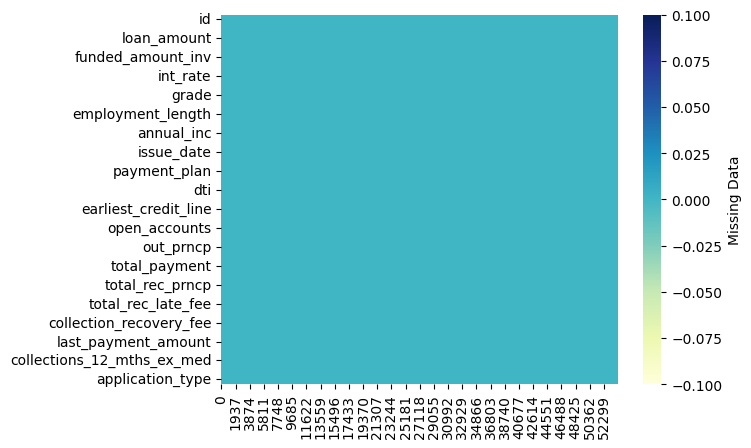

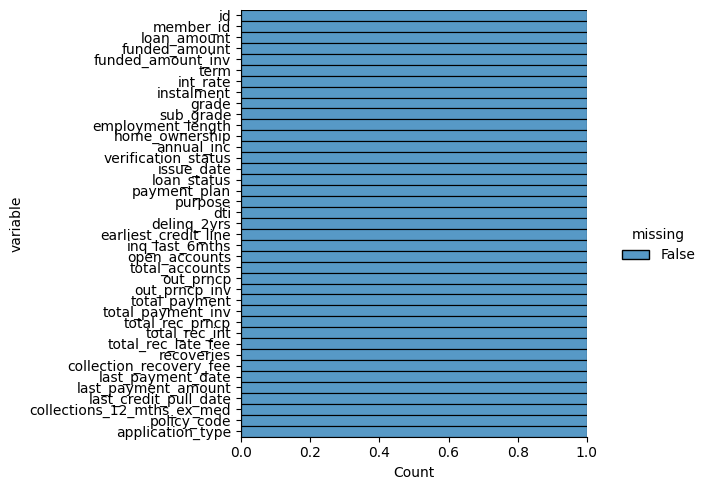

In [38]:
from Plotter import Plotter
plotter_instance = Plotter()
plotter_instance.visualise_null_values(df)


Skewness

Skewed data can lead to biased models and inaccurate results, so it's important to address this issue before proceeding with any analysis.

We identify the skewed columns in the data using standard Pandas methods. 

In [39]:
df.skew(axis=0,skipna=True,numeric_only=True)

id                              2.370336
member_id                       2.205422
loan_amount                     0.805259
funded_amount                   0.869922
funded_amount_inv               0.813927
int_rate                        0.456515
instalment                      0.996981
annual_inc                      8.711831
payment_plan                  232.875503
dti                              0.18942
delinq_2yrs                     5.370002
inq_last_6mths                  3.248918
open_accounts                   1.059282
total_accounts                  0.779014
out_prncp                       2.356426
out_prncp_inv                   2.356848
total_payment                   1.267891
total_payment_inv               1.256197
total_rec_prncp                 1.261015
total_rec_int                   2.204322
total_rec_late_fee             13.184305
recoveries                     14.589793
collection_recovery_fee        27.636843
last_payment_amount             2.499381
collections_12_m

payment_plan is a Boolean datatype so we don't care about its skew.

Ideally the skewness of each column should be zero, to perfectly follow a normal dsitribution. We can see that many columns have an acceptable realistic skewness between of less than 3, but there are other columns which are significantly skewed. 

We also visualise the data using the Plotter class to analyse the skew. 

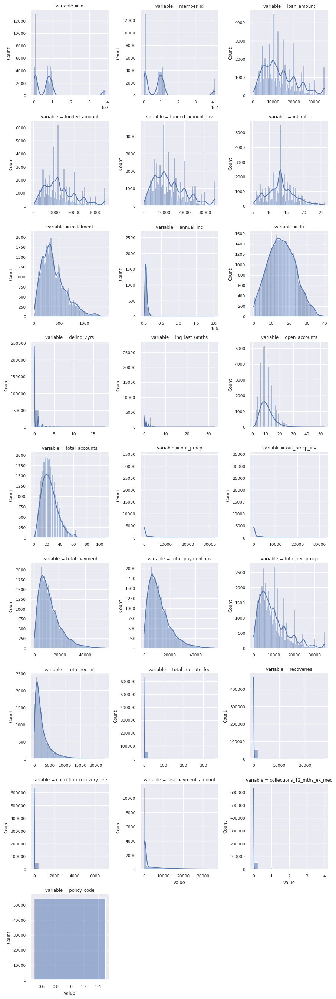

In [40]:
plotter_instance.skewness(df)

We can test if natural log transformations produce the biggest reduction in these columns' skewness:

In [41]:
log_transformed_df = dataframe_transforming_instance.log_transform_skewed_numeric_columns(df,skewnessthreshold = 3)

annual_inc has a skewness of 8.711830518933832
annual_inc is very skewed
annual_inc has a new skewness after a log transformation of 0.1377740772799464
This is a change in skewness of 8.574056441653886


delinq_2yrs has a skewness of 5.370001885877136
delinq_2yrs is very skewed
delinq_2yrs has a new skewness after a log transformation of 5.409214871435127
This is a change in skewness of -0.0392129855579908


inq_last_6mths has a skewness of 3.248918364007299
inq_last_6mths is very skewed
inq_last_6mths has a new skewness after a log transformation of 1.9696945626229754
This is a change in skewness of 1.2792238013843238


total_rec_late_fee has a skewness of 13.184304523859357
total_rec_late_fee is very skewed
total_rec_late_fee has a new skewness after a log transformation of 5.509527637633001
This is a change in skewness of 7.674776886226356


recoveries has a skewness of 14.58979334668037
recoveries is very skewed
recoveries has a new skewness after a log transformation of 3.78965791

In [42]:
log_transformed_df.skew(axis=0,skipna=True,numeric_only=True)

id                              2.370336
member_id                       2.205422
loan_amount                     0.805259
funded_amount                   0.869922
funded_amount_inv               0.813927
int_rate                        0.456515
instalment                      0.996981
annual_inc                      0.137774
payment_plan                  232.875503
dti                              0.18942
delinq_2yrs                     5.409215
inq_last_6mths                  1.969695
open_accounts                   1.059282
total_accounts                  0.779014
out_prncp                       2.356426
out_prncp_inv                   2.356848
total_payment                   1.267891
total_payment_inv               1.256197
total_rec_prncp                 1.261015
total_rec_int                   2.204322
total_rec_late_fee              5.509528
recoveries                      3.789658
collection_recovery_fee         5.387293
last_payment_amount             2.499381
collections_12_m

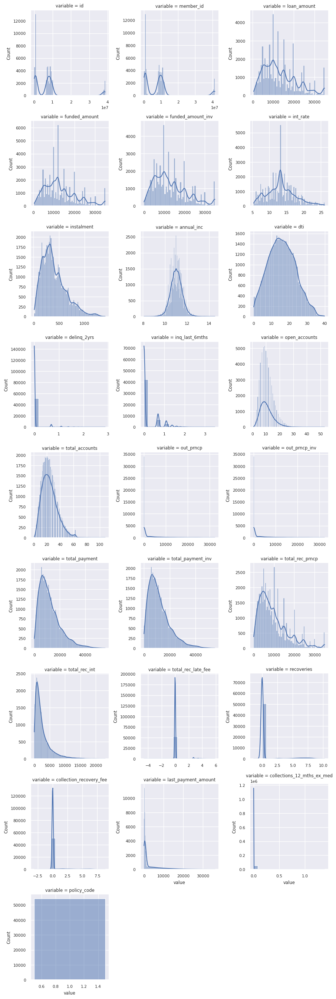

In [43]:
plotter_instance.skewness(log_transformed_df)

We can see that natural log transformations have been helpful for most skewed columns, but they did not help delinq_2yrs and collections_12_mths_ex_med and in fact made those columns' distributions more skewed. 

reduce the skewneess to closely match a normal distribution.




The data must be positive for a Box-Cox transformation, so it will not help us with these columns as they currently are:

In [44]:

print(set(df['delinq_2yrs']))

{0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 13, 15, 17, 18}


In [45]:
print(set(df['collections_12_mths_ex_med']))

{0, 1, 2, 3, 4}


Data mus be strictly positive for a Box-Cox transformation, so we linearly transform delinq_2yrs and collections_12mths_ex_med by adding 1, because 0 is a value in the original columns.

In [46]:
to_be_Box_Cox_transformed_df = df.copy()

for column_name in ('delinq_2yrs', 'collections_12_mths_ex_med'):
    to_be_Box_Cox_transformed_df[column_name] = to_be_Box_Cox_transformed_df[column_name].map(lambda i: i+1)


print(set(to_be_Box_Cox_transformed_df['delinq_2yrs']))


{1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 16, 18, 19}


In [47]:
print(set(df['collections_12_mths_ex_med']))

{0, 1, 2, 3, 4}


In [48]:
from scipy.stats import boxcox
import numpy as np

Box_Cox_transformed_df = to_be_Box_Cox_transformed_df.copy()

for column_name in ('delinq_2yrs', 'collections_12_mths_ex_med'):
    original_skew = Box_Cox_transformed_df[column_name].skew(axis=0,skipna=True,numeric_only=True)
    print(column_name,'has a skewness of',original_skew)
    Box_Cox_transformed_df[column_name] = boxcox(Box_Cox_transformed_df[column_name])[0]
    transformed_skew = Box_Cox_transformed_df[column_name].skew(axis=0,skipna=True,numeric_only=True)
    print(column_name,'has a new skewness after a Box-Cox transformation of',transformed_skew)
    print('This is a change in skewness of', original_skew - transformed_skew)  
    print('\n')


delinq_2yrs has a skewness of 5.370001885877136
delinq_2yrs has a new skewness after a Box-Cox transformation of 1.869437169417889
This is a change in skewness of 3.5005647164592473


collections_12_mths_ex_med has a skewness of 20.26237623499777
collections_12_mths_ex_med has a new skewness after a Box-Cox transformation of 16.01550894338625
This is a change in skewness of 4.246867291611519




THis is a big improvement in skewness. SO let's see what thsi transformation does to all the nuermical columns in the data. BEcaause soe columns has 0 values in, let's lienarly transform them by addign 1, so that they are strictly positive.

In [49]:
boxcox_input_df = df.copy()

numeric_features = dataframe_transforming_instance.create_numeric_features_list(boxcox_input_df)

for column_name in numeric_features:
    print(column_name, 'has this lowest value BEFORE the linear transformation:', list(set(boxcox_input_df[column_name]))[0])
    boxcox_input_df[column_name] = boxcox_input_df[column_name].map(lambda x : x +1 )
    print(column_name, 'has this lowest value AFTER the linear transformation:', list(set(boxcox_input_df[column_name]))[0])
    print('\n')

id has this lowest value BEFORE the linear transformation: 38141958
id has this lowest value AFTER the linear transformation: 38141959


member_id has this lowest value BEFORE the linear transformation: 10878976
member_id has this lowest value AFTER the linear transformation: 7208960


loan_amount has this lowest value BEFORE the linear transformation: 26625
loan_amount has this lowest value AFTER the linear transformation: 24576


funded_amount has this lowest value BEFORE the linear transformation: 26625.0
funded_amount has this lowest value AFTER the linear transformation: 24576.0


funded_amount_inv has this lowest value BEFORE the linear transformation: 0.0
funded_amount_inv has this lowest value AFTER the linear transformation: 1.0


int_rate has this lowest value BEFORE the linear transformation: 5.99
int_rate has this lowest value AFTER the linear transformation: 6.99


instalment has this lowest value BEFORE the linear transformation: 32.0
instalment has this lowest value AFTE

delinq_2yrs has this lowest value BEFORE the linear transformation: 0
delinq_2yrs has this lowest value AFTER the linear transformation: 1


inq_last_6mths has this lowest value BEFORE the linear transformation: 0
inq_last_6mths has this lowest value AFTER the linear transformation: 1


open_accounts has this lowest value BEFORE the linear transformation: 1
open_accounts has this lowest value AFTER the linear transformation: 2


total_accounts has this lowest value BEFORE the linear transformation: 1
total_accounts has this lowest value AFTER the linear transformation: 2


out_prncp has this lowest value BEFORE the linear transformation: 0.0
out_prncp has this lowest value AFTER the linear transformation: 1.0


out_prncp_inv has this lowest value BEFORE the linear transformation: 0.0
out_prncp_inv has this lowest value AFTER the linear transformation: 1.0


total_payment has this lowest value BEFORE the linear transformation: 0.0
total_payment has this lowest value AFTER the linear tra

In [50]:
Box_Cox_transformed_df = dataframe_transforming_instance.box_cox_transform(df, skewnessthreshold = 3)

annual_inc has a skewness of 8.711830518933832


annual_inc has a new skewness after a Box-Cox transformation of -0.011944790025991942
This is a change in skewness of 8.723775308959825


delinq_2yrs has a skewness of 5.370001885877136


ValueError: Data must be positive.

In [51]:
Box_Cox_transformed_df.skew(axis=0,skipna=True,numeric_only=True)

id                              2.370336
member_id                       2.205422
loan_amount                     0.805259
funded_amount                   0.869922
funded_amount_inv               0.813927
int_rate                        0.456515
instalment                      0.996981
annual_inc                      8.711831
payment_plan                  232.875503
dti                              0.18942
delinq_2yrs                     1.869437
inq_last_6mths                  3.248918
open_accounts                   1.059282
total_accounts                  0.779014
out_prncp                       2.356426
out_prncp_inv                   2.356848
total_payment                   1.267891
total_payment_inv               1.256197
total_rec_prncp                 1.261015
total_rec_int                   2.204322
total_rec_late_fee             13.184305
recoveries                     14.589793
collection_recovery_fee        27.636843
last_payment_amount             2.499381
collections_12_m

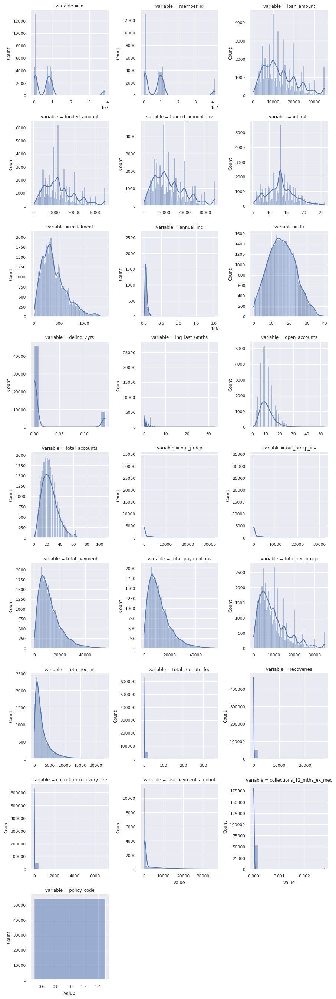

In [52]:
plotter_instance.skewness(Box_Cox_transformed_df)

We can now see how the skewness has improved for the nuemrical columsn compared to the earlier log transformation.

The Yeo-Johnson transformation is a generalisation of the Box-Cox transformation type which allows negative values.

In [53]:
Yeo_Johnson_input_df = df.copy()

Yeo_Johnson_transformed_df = dataframe_transforming_instance.Yeo_Johnson_transform(Yeo_Johnson_input_df, skewnessthreshold=3)

annual_inc has a skewness of 8.711830518933832
annual_inc has a new skewness after a Yeo-Johnson transformation of -0.011948187096718799
This is a change in skewness of 8.72377870603055


delinq_2yrs has a skewness of 5.370001885877136


delinq_2yrs has a new skewness after a Yeo-Johnson transformation of 1.8694371694334482
This is a change in skewness of 3.500564716443688


inq_last_6mths has a skewness of 3.248918364007299
inq_last_6mths has a new skewness after a Yeo-Johnson transformation of 0.25099902331764024
This is a change in skewness of 2.997919340689659


total_rec_late_fee has a skewness of 13.184304523859357
total_rec_late_fee has a new skewness after a Yeo-Johnson transformation of 5.279001956058618
This is a change in skewness of 7.905302567800739


recoveries has a skewness of 14.58979334668037
recoveries has a new skewness after a Yeo-Johnson transformation of 3.4462690851112603
This is a change in skewness of 11.143524261569109


collection_recovery_fee has a skewness of 27.63684310809756
collection_recovery_fee has a new skewness after a Yeo-Johnson transformation of 3.588305841417681
This is a change in skewness of 24.048537266679876


collections_12_mths_ex_med has a skewness of 20.26237623499777
c

The Yeo_johnson transformatino is marginally better at transforming the distribution of e.g. collections_12_mths_ex_med to fit a normal distribution.

In [54]:
Yeo_Johnson_transformed_df.skew(axis=0,skipna=True,numeric_only=True)

id                              2.370336
member_id                       2.205422
loan_amount                     0.805259
funded_amount                   0.869922
funded_amount_inv               0.813927
int_rate                        0.456515
instalment                      0.996981
annual_inc                     -0.011948
payment_plan                  232.875503
dti                              0.18942
delinq_2yrs                     1.869437
inq_last_6mths                  0.250999
open_accounts                   1.059282
total_accounts                  0.779014
out_prncp                       2.356426
out_prncp_inv                   2.356848
total_payment                   1.267891
total_payment_inv               1.256197
total_rec_prncp                 1.261015
total_rec_int                   2.204322
total_rec_late_fee              5.279002
recoveries                      3.446269
collection_recovery_fee         3.588306
last_payment_amount             2.499381
collections_12_m

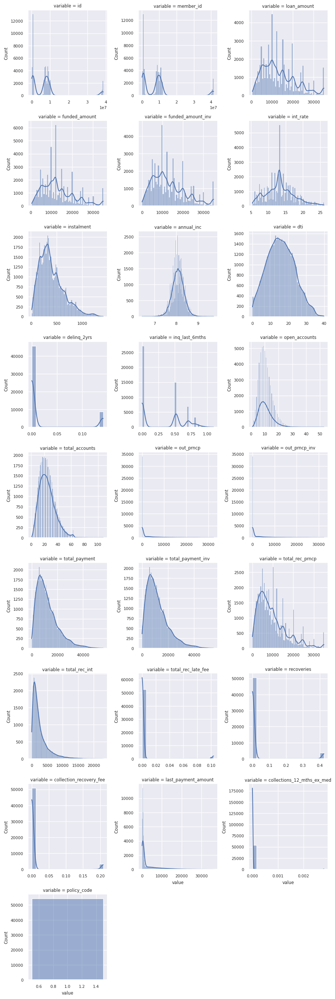

In [55]:
plotter_instance.skewness(Yeo_Johnson_transformed_df)

So we will use Yeo-Johnson for reducing the skewness of the data:

In [56]:
df = Yeo_Johnson_transformed_df

# Outliers

We can visualise outliers in the data using histograms:

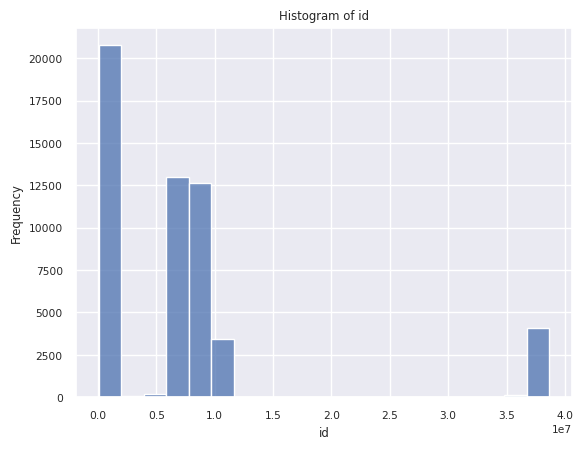

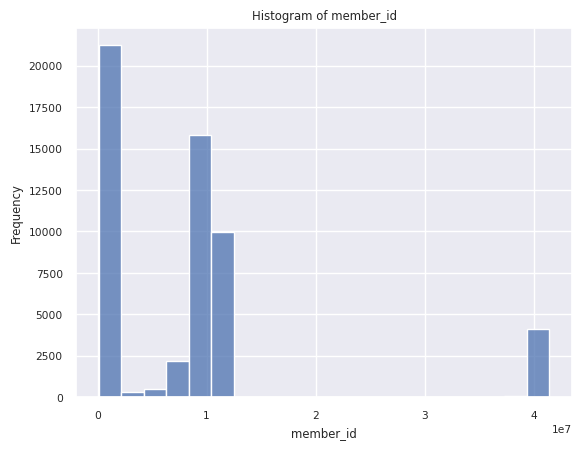

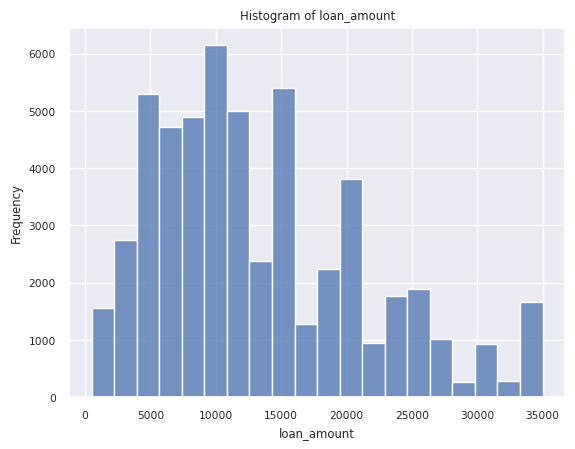

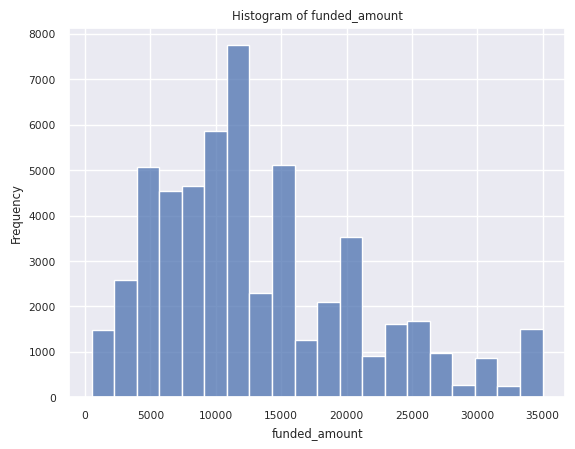

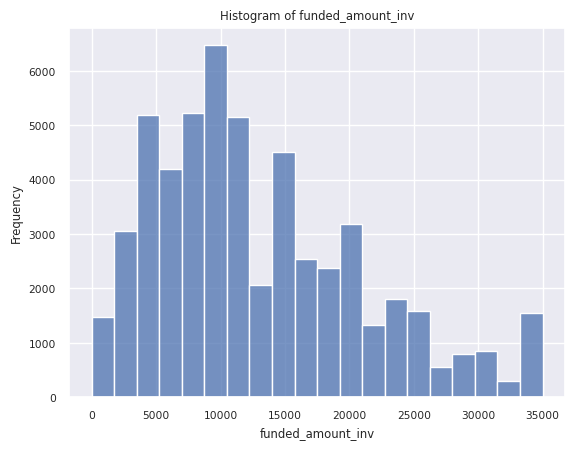

...

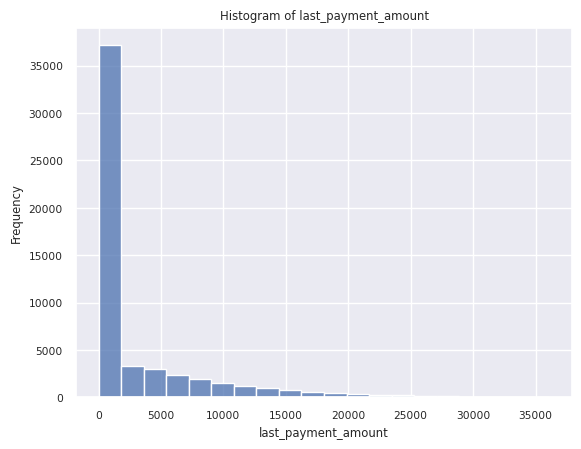

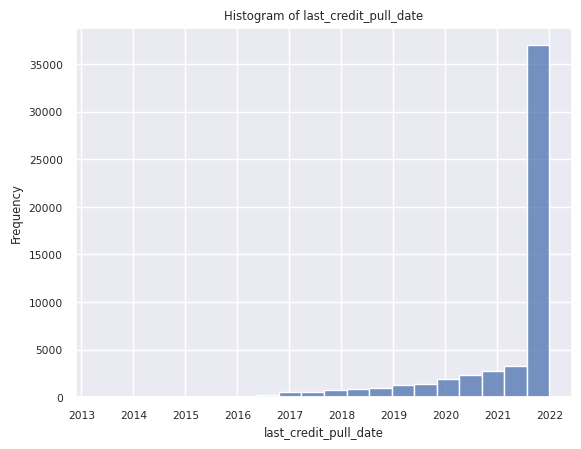

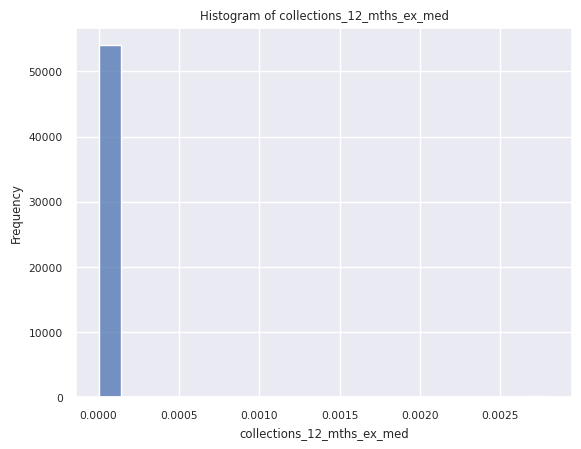

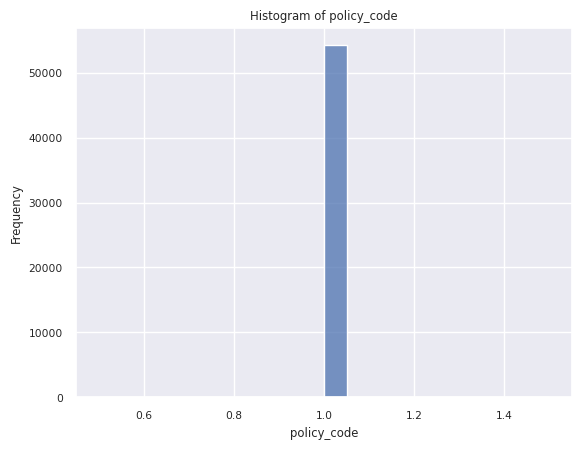

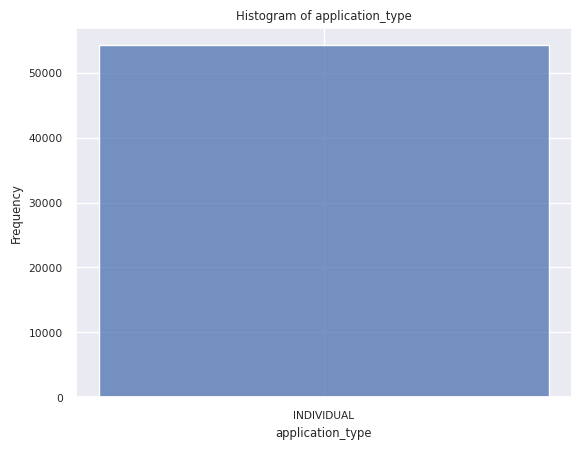

In [57]:
outliers_df = df

# grid = sns.FacetGrid(data=outliers_df, col=column_name, col_wrap=2)
# grid = sns.FacetGrid(data=outliers_df, col = outliers_df, col_wrap=2)
# grid.map(sns.histplot(df[column_name], bins=20, kde=False))


for column_name in outliers_df:
    if outliers_df[column_name].dtype == 'datetime64':
        outliers_df[column_name] = df_transforming_instance.convert_to_category(outliers_df, column_name)
    # grid.map(sns.histplot(df[column_name], bins=20, kde=False))
    sns.histplot(df[column_name], bins=20, kde=False)
    plt.title(f"Histogram of {column_name}")
    plt.ylabel('Frequency')
    plt.show()

For categorical data, we can use the histograms and realistic intuition to judge what are outliers and drop them.

In [58]:
# for column_name in outliers_df:
#     print('The',column_name,'column has', len(set(df[column_name])),'unique elements:')
#     print(list(set(df[column_name])))
#     # print(list(dict.fromkeys(df[column_name])))
#     print(column_name, 'has this lowest value:', list(outliers_df[column_name]).sort()[0])

We can automaitcally remove  numerical outliers by dropping rows containing column values more than two standard deviations from the column's mean (a high Z-Score of 2):

In [69]:
from scipy import stats

def drop_numerical_outliers(df,z_thresh=3):
    # Constrains will contain 'True' or 'False' depending on if it is a value below the threshold.
    constrains = df.select_dtypes(include=[np.number]) \
        .apply(lambda x : np.abs(stats.zscore(x)) < z_thresh, result_type='reduce')\
            .all() # axis=1)
    # Drop values set to be rejected.
    df.drop(df.index[~constrains], inplace=True)

In [70]:
outliers_df = df

drop_numerical_outliers(outliers_df)

ValueError: setting an array element with a sequence.

In [ ]:
# from scipy import stats

# outliers_df[(np.abs(stats.zscore(outliers_df[[numeric_features]])) < 2).all(axis=1)]

TypeError: unsupported operand type(s) for +: 'Timestamp' and 'Timestamp'

In [101]:
number_df = outliers_df.select_dtypes(include=[np.number])

,id,member_id,loan_amount,funded_amount,funded_amount_inv,int_rate,instalment,annual_inc,dti,delinq_2yrs,...,total_payment,total_payment_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_payment_amount,collections_12_mths_ex_med,policy_code
4201,23092909,25445834,7000,7000.0,7000.0,12.99,235.83,7.481567,16.85,-0.000000,...,7750.94,7750.94,7000.00,750.94,-0.000000,-0.000000,-0.000000,5402.74,-0.0,1
4202,19066284,21268989,30000,30000.0,30000.0,24.50,871.77,8.186276,6.91,-0.000000,...,6105.15,6105.15,1350.38,4711.18,0.103884,-0.000000,-0.000000,1787.13,-0.0,1
4203,17382831,19505381,16000,16000.0,16000.0,10.49,519.97,8.165331,14.21,-0.000000,...,6220.99,6220.99,4787.06,1433.93,-0.000000,-0.000000,-0.000000,519.97,-0.0,1
4204,15309436,17381884,12000,12000.0,12000.0,8.67,247.19,7.943419,19.18,-0.000000,...,2960.50,2960.50,2004.28,956.22,-0.000000,-0.000000,-0.000000,247.19,-0.0,1
4205,14469434,16531751,15000,15000.0,15000.0,13.16,510.20,7.996529,10.18,-0.000000,...,6099.63,6099.63,4338.36,1761.27,-0.000000,-0.000000,-0.000000,510.20,-0.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54226,76597,76583,5000,5000.0,1775.0,9.01,159.03,8.781666,10.00,0.141497,...,5724.82,2032.29,5000.00,724.82,-0.000000,-0.000000,-0.000000,160.61,-0.0,1
54227,142608,74724,5000,5000.0,2350.0,10.59,162.73,7.320701,24.40,-0.000000,...,5931.25,2787.47,5000.00,826.31,0.103884,-0.000000,-0.000000,490.01,-0.0,1
54228,117045,70978,3500,3500.0,2225.0,7.43,108.77,8.868164,1.00,-0.000000,...,3915.37,2489.01,3500.00,415.37,-0.000000,-0.000000,-0.000000,110.58,-0.0,1
54229,88854,70699,5000,5000.0,225.0,7.43,155.38,8.674515,0.28,-0.000000,...,5174.18,232.84,5000.00,174.18,-0.000000,-0.000000,-0.000000,0.00,-0.0,1


In [9]:
number_df = outliers_df.select_dtypes(include=[np.number])

from scipy import stats



outliers_df[(np.abs(stats.zscore(number_df)) < 2).all(axis=1)]

,id,member_id,loan_amount,funded_amount,funded_amount_inv,term,int_rate,instalment,grade,sub_grade,...,recoveries,collection_recovery_fee,last_payment_date,last_payment_amount,next_payment_date,last_credit_pull_date,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type


In [7]:
outliers_df = df

import numpy as np

column_length = outliers_df.shape[0]+1
print('column length is',column_length)
# len(outliers_df[column_name])

for column_name in outliers_df.select_dtypes(include=[np.number]): # but NOT ID column
    print('column_name:',column_name)
    current_mean = np.mean(outliers_df[column_name])
    print('current_mean:',current_mean)
    current_std = np.std(outliers_df[column_name])
    print('current_std:',current_std)
    t = 0
    i=0
    
    while i in range(outliers_df.shape[0]+1):        # column_length):
        print(i)
        i += 1
        # print(outliers_df.iloc[i])
        # print(outliers_df.head())
            #   , column_name])
        j = outliers_df.columns.get_loc(column_name)
        print('current value',outliers_df.iat[i, j])
        current_z_score = (outliers_df.iat[i, j] - current_mean) / current_std
        print('current_z_score:',current_z_score)
        if abs(current_z_score) > 2:
            # outliers_df.drop(i)
            # outliers_df = outliers_df.drop(i)

            # outliers_df_with_extreme_z_scores_dropped = 
            outliers_df.drop(outliers_df.index[i], inplace=True)
            
            # outliers_df.drop([0,i], inplace=True)
            t += 1
            # print(t)
    column_length -= t
    print(column_name,'has',t,'outliers removed from it.')
    print('New reduced column length is:',column_length)


column length is 50233
column_name: id
current_mean: 5188735.344063546
current_std: 4312069.1707837265
0
current value 37781932
current_z_score: 7.558597825093001
1
current value 37780507
current_z_score: 7.558267357295857
2
current value 37772112
current_z_score: 7.5563204961330355
3
current value 37771568
current_z_score: 7.556194338602055
4
current value 37770186
current_z_score: 7.5558738428156325
5
current value 37762155
current_z_score: 7.554011395883099
6
current value 37761760
current_z_score: 7.553919792528803
7
current value 37761027
current_z_score: 7.553749804532097
8
current value 37752323
current_z_score: 7.55173128403642
9
current value 37752023
current_z_score: 7.551661711868601
10
current value 37751698
current_z_score: 7.551586342020129
11
current value 37750806
current_z_score: 7.551379480774479
12
current value 37742183
current_z_score: 7.5493797447641136
13
current value 37741710
current_z_score: 7.549270052646185
14
current value 37741137
current_z_score: 7.549137

IndexError: index 50127 is out of bounds for axis 0 with size 50127

In [ ]:
outliers_df = df

import numpy as np

column_length = outliers_df.shape[0]+1
print('column length is',column_length)
# len(outliers_df[column_name])

for column_name in outliers_df.select_dtypes(include=[np.number]): # but NOT ID column
    print('column_name:',column_name)
    current_mean = np.mean(outliers_df[column_name])
    print('current_mean:',current_mean)
    current_std = np.std(outliers_df[column_name])
    print('current_std:',current_std)
    t = 0
    i=0
    
    while i in range(outliers_df.shape[0]+1):        # column_length):
        print(i)
        i += 1
        # print(outliers_df.iloc[i])
        # print(outliers_df.head())
            #   , column_name])
        j = outliers_df.columns.get_loc(column_name)
        print('current value',outliers_df.iat[i, j])
        current_z_score = (outliers_df.iat[i, j] - current_mean) / current_std
        print('current_z_score:',current_z_score)
        if abs(current_z_score) > 2:
            # outliers_df.drop(i)
            # outliers_df = outliers_df.drop(i)

            outliers_df_with_extreme_z_scores_dropped = dataframe[outliers_df[column_name] & curr]
            outliers_df.drop(outliers_df.index[i], inplace=True)
            
            # outliers_df.drop([0,i], inplace=True)
            t += 1
            # print(t)
    column_length -= t
    print(column_name,'has',t,'outliers removed from it.')
    print('New reduced column length is:',column_length)


We can also remove rows containing values that lie more than 1.5 lots of the interquartile range (IQR) beyond the upper and lower quartiles of their resepective columns.

In [42]:
df

,id,member_id,loan_amount,funded_amount,funded_amount_inv,term,int_rate,instalment,grade,sub_grade,...,recoveries,collection_recovery_fee,last_payment_date,last_payment_amount,next_payment_date,last_credit_pull_date,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type
3379,37782060,40545117,8000,8000.0,8000.0,36 months,12.99,269.52,C,C2,...,0.00,0.00,Jan-2022,269.52,Feb-2022,Jan-2022,0.0,66.0,1,INDIVIDUAL
3387,37781270,40544216,1600,1600.0,1600.0,36 months,NaN,53.45,C,C1,...,0.00,0.00,Jan-2022,53.45,Feb-2022,Jan-2022,0.0,57.0,1,INDIVIDUAL
3395,37780200,40542921,20000,20000.0,20000.0,60 months,13.66,461.85,C,C3,...,0.00,0.00,Jan-2022,461.85,Feb-2022,Jan-2022,0.0,NaN,1,INDIVIDUAL
3403,37771853,40534900,7000,7000.0,7000.0,36 months,9.49,224.20,B,B2,...,0.00,0.00,Jan-2022,224.20,Feb-2022,Jan-2022,0.0,1.0,1,INDIVIDUAL
3411,37770779,40533606,24000,24000.0,24000.0,60 months,13.66,554.22,C,C3,...,0.00,0.00,Sep-2021,22395.24,NaN,Sep-2021,0.0,NaN,1,INDIVIDUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54226,76597,76583,5000,5000.0,1775.0,36 months,9.01,159.03,B,B2,...,0.00,0.00,Jul-2016,160.61,NaN,Jul-2016,NaN,NaN,1,INDIVIDUAL
54227,142608,74724,5000,5000.0,2350.0,36 months,10.59,162.73,C,C2,...,0.00,0.00,Oct-2016,490.01,NaN,Sep-2016,0.0,NaN,1,INDIVIDUAL
54228,117045,70978,3500,3500.0,2225.0,36 months,7.43,108.77,A,A2,...,0.00,0.00,Sep-2016,110.58,Sep-2016,May-2013,NaN,NaN,1,INDIVIDUAL
54229,88854,70699,5000,5000.0,225.0,36 months,7.43,155.38,A,A2,...,0.00,0.00,Mar-2014,0.00,NaN,May-2013,NaN,NaN,1,INDIVIDUAL


In [43]:
outliers_df = df

In [44]:
def quartile_outliers(df, column_name):
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q1 + 1.5 * IQR

    indices_of_quartile_outliers = df.index[(df[column_name] < lower_bound) | (df[column_name] > upper_bound)]

    return indices_of_quartile_outliers

In [45]:
index_list = []

# numeric_features = outliers_df.select_dtypes(include=[np.number])
# numeric_features = dataframe_transforming_instance.create_numeric_features_list(outliers_df)

numeric_features = [
 'loan_amount',
 'funded_amount',
 'funded_amount_inv',
 'int_rate',
 'instalment',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'open_accounts',
 'total_accounts',
 'out_prncp',
 'out_prncp_inv',
 'total_payment',
 'total_payment_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_payment_amount',
 'collections_12_mths_ex_med',
 'policy_code'
 ]

for column_name in numeric_features:
    #  not 'id':
    # indices_of_quartile_outliers = quartile_outliers(outliers_df, column_name)
    index_list.extend(quartile_outliers(outliers_df, column_name))

In [46]:
len(index_list)

137233

In [47]:
def remove(df, indices):
    indices = sorted(set(indices))
    df = df.drop(indices)
    return df

In [48]:
outliers_df_cleaned = remove(outliers_df, index_list)

In [49]:
outliers_df_cleaned

,id,member_id,loan_amount,funded_amount,funded_amount_inv,term,int_rate,instalment,grade,sub_grade,...,recoveries,collection_recovery_fee,last_payment_date,last_payment_amount,next_payment_date,last_credit_pull_date,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type
3507,37732066,40495108,5000,NaN,5000.0,NaN,12.39,167.01,C,C1,...,0.0,0.0,Jan-2022,167.01,Feb-2022,Jan-2022,0.0,NaN,1,INDIVIDUAL
3603,37691119,40464034,5725,5725.0,5725.0,36 months,17.86,206.58,D,D5,...,0.0,0.0,Jun-2021,5329.16,NaN,Sep-2021,0.0,NaN,1,INDIVIDUAL
3659,37720650,40443427,7900,7900.0,7900.0,NaN,17.14,282.21,D,D4,...,0.0,0.0,May-2021,282.21,NaN,Dec-2021,0.0,NaN,1,INDIVIDUAL
3723,37660542,40423304,4500,4500.0,4500.0,36 months,8.67,142.41,B,B1,...,0.0,0.0,Jan-2022,142.41,Feb-2022,Jan-2022,0.0,NaN,1,INDIVIDUAL
3819,37621257,40384173,4000,4000.0,4000.0,36 months,13.66,136.06,C,C3,...,0.0,0.0,Jan-2022,136.06,Feb-2022,Jan-2022,0.0,NaN,1,INDIVIDUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54217,92552,92542,5000,5000.0,375.0,36 months,9.96,161.25,B,B5,...,0.0,0.0,Jul-2016,162.07,NaN,Jun-2016,NaN,NaN,1,INDIVIDUAL
54219,92507,92502,5000,5000.0,250.0,36 months,7.43,155.38,A,A2,...,0.0,0.0,Jul-2016,156.29,NaN,Jun-2013,NaN,NaN,1,INDIVIDUAL
54220,92440,92423,5000,5000.0,3100.0,36 months,7.43,155.38,A,A2,...,0.0,0.0,Jul-2016,157.38,NaN,Jun-2013,NaN,NaN,1,INDIVIDUAL
54222,90395,90390,5000,5000.0,1325.0,36 months,8.07,156.84,A,A4,...,0.0,0.0,Apr-2014,0.00,NaN,Jun-2013,NaN,NaN,1,INDIVIDUAL


In [50]:
outliers_df_cleaned.shape()

TypeError: 'tuple' object is not callable

In [ ]:
numeric_features

['id',
 'member_id',
 'loan_amount',
 'funded_amount',
 'funded_amount_inv',
 'int_rate',
 'instalment',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'inq_last_6mths',
 'open_accounts',
 'total_accounts',
 'out_prncp',
 'out_prncp_inv',
 'total_payment',
 'total_payment_inv',
 'total_rec_prncp',
 'total_rec_int',
 'total_rec_late_fee',
 'recoveries',
 'collection_recovery_fee',
 'last_payment_amount',
 'collections_12_mths_ex_med',
 'policy_code']

In [ ]:
pause = 1/0

ZeroDivisionError: division by zero

In [ ]:
numeric_features = dataframe_transforming_instance.create_numeric_features_list(df)
plotter_instance.pair_plot(df,numeric_features)

KeyboardInterrupt: 

In [ ]:
plotter_instance.correlation_matrix(df)